In [1]:
import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False


2022-02-08 14:26:33.754696: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-02-08 14:26:33.754712: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
df = pd.read_csv('./data/ouput.csv')

In [3]:
df["tstp"] = pd.to_datetime(df["tstp"])

In [4]:
df["energy(kWh/hh)"] = pd.to_numeric(df["energy(kWh/hh)"], downcast="float", errors="coerce")

In [5]:
df.loc[0,"tstp"].year

2011

In [6]:
df.describe(datetime_is_numeric=True).transpose()


,count,mean,min,25%,50%,75%,max,std
tstp,396562,2013-01-10 20:36:04.252752640,2011-11-23 10:00:00,2012-06-18 06:30:00,2013-01-10 21:15:00,2013-08-05 10:52:30,2014-02-28 00:00:00,NaN
energy(kWh/hh),396552.0,0.217255,0.0,0.068,0.118,0.251,4.595,0.301549


In [7]:
df["tstp"] = df["tstp"].map(pd.Timestamp.timestamp)


In [8]:
day = 24*60*60
year = (365.2425)*day

df['Day sin'] = np.sin(df["tstp"] * (2 * np.pi / day))
df['Day cos'] = np.cos(df["tstp"]* (2 * np.pi / day))
df['Year sin'] = np.sin(df["tstp"] * (2 * np.pi / year))
df['Year cos'] = np.cos(df["tstp"] * (2 * np.pi / year))


In [9]:
hh_filt = df["LCLid"] == "MAC000150"
hh_df = df[hh_filt]

In [10]:
hh_df.pop("LCLid")
#timestamps = hh_df.pop("tstp")

356842    MAC000150
356843    MAC000150
356844    MAC000150
356845    MAC000150
356846    MAC000150
            ...    
396557    MAC000150
396558    MAC000150
396559    MAC000150
396560    MAC000150
396561    MAC000150
Name: LCLid, Length: 39720, dtype: object

In [11]:
hh_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
tstp,39720.0,1.357794e+09,2.064148e+07,1.322042e+09,1.339920e+09,1.357793e+09,1.375670e+09,1.393546e+09
energy(kWh/hh),39719.0,2.033993e-01,2.320326e-01,4.000000e-02,8.600000e-02,1.280000e-01,2.030000e-01,2.631000e+00
Day sin,39720.0,-4.065533e-04,7.071103e-01,-1.000000e+00,-7.071068e-01,-8.563974e-14,7.071068e-01,1.000000e+00
Day cos,39720.0,-2.209907e-04,7.071209e-01,-1.000000e+00,-7.071068e-01,-5.929581e-14,7.071068e-01,1.000000e+00
Year sin,39720.0,1.736227e-02,6.831672e-01,-1.000000e+00,-6.296250e-01,3.353554e-02,6.782354e-01,1.000000e+00
Year cos,39720.0,1.027878e-01,7.228006e-01,-1.000000e+00,-6.294092e-01,2.074566e-01,8.292171e-01,1.000000e+00


In [12]:
column_indices = {name: i for i, name in enumerate(df.columns)}

n = len(hh_df)
train_df = hh_df[0:int(n*0.7)]
val_df = hh_df[int(n*0.7):int(n*0.9)]
test_df = hh_df[int(n*0.9):]

num_features = hh_df.shape[1]


In [13]:
train_mean = train_df.mean()
train_std = train_df.std()

train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std
test_df = (test_df - train_mean) / train_std

In [14]:
train_df

,tstp,energy(kWh/hh),Day sin,Day cos,Year sin,Year cos
356842,-1.732031,0.419369,0.707440,-1.223862,-1.187815,0.992976
356843,-1.731907,-0.324692,0.541527,-1.305676,-1.187395,0.993285
356844,-1.731782,-0.008253,0.366354,-1.365136,-1.186975,0.993595
356845,-1.731658,1.544014,0.184918,-1.401223,-1.186555,0.993904
356846,-1.731533,-0.187854,0.000324,-1.413321,-1.186135,0.994213
...,...,...,...,...,...,...
384641,1.731437,-0.576989,-0.999689,-0.999128,-0.075927,-1.489872
384642,1.731561,-0.504294,-1.121662,-0.860053,-0.076457,-1.489936
384643,1.731686,-0.619751,-1.224437,-0.706249,-0.076987,-1.489999
384644,1.731810,-0.581265,-1.306256,-0.540346,-0.077517,-1.490062


In [15]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, test_df=test_df,
               label_columns=None):
    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  @property
  def train(self):
      return self.make_dataset(self.train_df)

  @property
  def val(self):
      return self.make_dataset(self.val_df)

  @property
  def test(self):
      return self.make_dataset(self.test_df)
  
  @property
  def example(self):
      """Get and cache an example batch of `inputs, labels` for plotting."""
      result = getattr(self, '_example', None)
      if result is None:
        # No example batch was found, so get one from the `.train` dataset
        result = next(iter(self.train))
        # And cache it for next time
        self._example = result
      return result


  def split_window(self, features):
      inputs = features[:, self.input_slice, :]
      labels = features[:, self.labels_slice, :]
      if self.label_columns is not None:
        labels = tf.stack(
            [labels[:, :, self.column_indices[name]] for name in self.label_columns],
            axis=-1)

      # Slicing doesn't preserve static shape information, so set the shapes
      # manually. This way the `tf.data.Datasets` are easier to inspect.
      inputs.set_shape([None, self.input_width, None])
      labels.set_shape([None, self.label_width, None])

      return inputs, labels

  def make_dataset(self, data):
      data = np.array(data, dtype=np.float32)
      ds = tf.keras.utils.timeseries_dataset_from_array(
          data=data,
          targets=None,
          sequence_length=self.total_window_size,
          sequence_stride=1,
          shuffle=True,
          batch_size=32,)

      ds = ds.map(self.split_window)

      return ds
    
  def plot(self, model=None, plot_col='energy(kWh/hh)', max_subplots=3):
      inputs, labels = self.example
      plt.figure(figsize=(12, 8))
      plot_col_index = self.column_indices[plot_col]
      max_n = min(max_subplots, len(inputs))
      for n in range(max_n):
        plt.subplot(max_n, 1, n+1)
        plt.ylabel(f'{plot_col} [normed]')
        plt.plot(self.input_indices, inputs[n, :, plot_col_index],
                 label='Inputs', marker='.', zorder=-10)

        if self.label_columns:
          label_col_index = self.label_columns_indices.get(plot_col, None)
        else:
          label_col_index = plot_col_index

        if label_col_index is None:
          continue

        plt.scatter(self.label_indices, labels[n, :, label_col_index],
                    edgecolors='k', label='Labels', c='#2ca02c', s=64)
        if model is not None:
          predictions = model(inputs)
          plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                      marker='X', edgecolors='k', label='Predictions',
                      c='#ff7f0e', s=64)

        if n == 0:
          plt.legend()

        plt.xlabel('Time [hh]')


    
  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])


In [16]:

w2 = WindowGenerator(input_width=6, label_width=1, shift=1,
                     label_columns=['energy(kWh/hh)'])
w2

Total window size: 7
Input indices: [0 1 2 3 4 5]
Label indices: [6]
Label column name(s): ['energy(kWh/hh)']

In [17]:
single_step_window = WindowGenerator(
    input_width=1, label_width=1, shift=1,
    label_columns=['energy(kWh/hh)'], train_df=train_df, val_df=val_df, test_df=test_df)
single_step_window

Total window size: 2
Input indices: [0]
Label indices: [1]
Label column name(s): ['energy(kWh/hh)']

In [18]:
for element in single_step_window.train:
  print(element)


2022-02-08 14:26:35.587475: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-08 14:26:35.587753: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-02-08 14:26:35.587799: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory
2022-02-08 14:26:35.587831: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open shared object file: No such file or directory
2022-02-08 14:26:35.587859: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Co

(<tf.Tensor: shape=(32, 1, 6), dtype=float32, numpy=
array([[[ 1.20211244e+00, -5.17122149e-01,  8.61253500e-01,
          1.12274015e+00,  1.22009194e+00,  6.73353160e-03]],

       [[-6.39124095e-01, -5.59884369e-01,  1.30690360e+00,
          5.41993380e-01,  6.53251410e-01, -1.20418215e+00]],

       [[ 3.01426321e-01, -5.55608094e-01,  1.84917971e-01,
         -1.40122318e+00, -1.59426641e+00,  5.28957665e-01]],

       [[ 8.63389671e-01, -6.19751334e-01,  3.66353810e-01,
         -1.36513555e+00,  4.70490992e-01,  1.10997891e+00]],

       [[ 4.29988980e-01,  6.33179843e-01, -1.84270650e-01,
          1.40287030e+00, -1.26006329e+00,  9.36117709e-01]],

       [[ 1.28894198e+00, -5.72712958e-01, -9.99689341e-01,
         -9.99127865e-01,  1.20331764e+00, -3.40911955e-01]],

       [[-6.91944420e-01, -5.38503230e-01,  1.12230933e+00,
         -8.60053301e-01,  8.20309579e-01, -1.06115234e+00]],

       [[-2.73991197e-01, -2.99035192e-01,  1.41455555e+00,
          8.23570357e-04, 

(<tf.Tensor: shape=(32, 1, 6), dtype=float32, numpy=
array([[[-1.3270340e+00,  1.0720528e-01,  1.1223093e+00,  8.6170042e-01,
          4.4651088e-01,  1.1224716e+00]],

       [[-1.2829340e+00, -4.2304543e-01, -1.8427065e-01, -1.4012232e+00,
          6.0646534e-01,  1.0281587e+00]],

       [[-1.8105735e-01,  3.7206070e+00, -1.3657194e+00,  3.6683121e-01,
         -1.1719577e+00, -1.2134992e+00]],

       [[-4.6820554e-01, -6.0264647e-01, -1.4018093e+00,  1.8540652e-01,
         -9.7171757e-03, -1.4804842e+00]],

       [[-9.4857144e-01, -6.2402755e-01,  5.4152679e-01, -1.3056760e+00,
          1.2246300e+00, -1.2712389e-01]],

       [[ 5.3712451e-01,  2.0983447e-01, -8.6060619e-01,  1.1227401e+00,
         -8.7631905e-01,  1.1697174e+00]],

       [[ 7.5787359e-01,  1.5098039e+00, -1.3062563e+00,  5.4199338e-01,
          4.9410999e-02,  1.2606779e+00]],

       [[ 1.0143760e+00,  2.3992567e+00, -1.3657194e+00, -3.6518407e-01,
          9.4755542e-01,  7.0685601e-01]],

       [[-1

(<tf.Tensor: shape=(32, 1, 6), dtype=float32, numpy=
array([[[ 2.5109753e-01, -5.5988437e-01,  5.4152679e-01,  1.3073231e+00,
         -1.6779035e+00,  3.4271613e-01]],

       [[ 1.0363015e+00,  4.8778847e-01,  1.0003366e+00, -9.9912786e-01,
          9.9972218e-01,  6.3357550e-01]],

       [[ 3.4477887e-01,  1.3601365e+00, -1.4018093e+00, -1.8375938e-01,
         -1.4998535e+00,  6.7889339e-01]],

       [[ 3.6421275e-01, -5.3850323e-01, -1.8427065e-01,  1.4028703e+00,
         -1.4512085e+00,  7.4228793e-01]],

       [[ 5.3251523e-01, -4.1876924e-01,  1.0003366e+00,  1.0007750e+00,
         -8.9429677e-01,  1.1620193e+00]],

       [[-1.3823458e+00, -4.2462245e-02, -8.6060619e-01,  1.1227401e+00,
          2.3003055e-01,  1.2127296e+00]],

       [[-1.0721511e+00, -6.0264647e-01, -1.4018093e+00,  1.8540652e-01,
          1.1398329e+00,  3.6041170e-01]],

       [[ 4.4443983e-01, -6.0264647e-01,  8.6125350e-01, -1.1210930e+00,
         -1.2130491e+00,  9.7394091e-01]],

       [[-1

(<tf.Tensor: shape=(32, 1, 6), dtype=float32, numpy=
array([[[-1.2549636e-01, -4.1876924e-01,  7.0743960e-01,  1.2255089e+00,
         -1.3487780e+00, -1.0642118e+00]],

       [[-1.3343840e+00, -4.1449299e-01, -7.0679229e-01,  1.2255089e+00,
          4.1866627e-01,  1.1363093e+00]],

       [[ 1.6956834e+00, -5.5988437e-01, -1.1216619e+00, -8.6005330e-01,
          7.4873060e-02, -1.4642842e+00]],

       [[-1.4025272e+00,  8.4271437e-01, -1.8427065e-01, -1.4012232e+00,
          1.4762545e-01,  1.2374687e+00]],

       [[ 2.6716787e-01, -1.5792011e-01, -1.4139082e+00,  8.2357036e-04,
         -1.6543376e+00,  4.0339240e-01]],

       [[-5.6487668e-01,  4.1081655e-01, -8.6060619e-01, -1.1210930e+00,
          3.8359037e-01, -1.3617407e+00]],

       [[ 1.1129158e+00, -3.6317840e-01,  1.3069036e+00,  5.4199338e-01,
          1.1413131e+00,  3.5646337e-01]],

       [[-7.3921807e-02, -3.3324492e-01, -1.3657194e+00, -3.6518407e-01,
         -1.4882865e+00, -9.0364617e-01]],

       [[-2

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [19]:
class Baseline(tf.keras.Model):
  def __init__(self, label_index=None):
    super().__init__()
    self.label_index = label_index

  def call(self, inputs):
    if self.label_index is None:
      return inputs
    result = inputs[:, :, self.label_index]
    return result[:, :, tf.newaxis]


In [ ]:
baseline = Baseline(label_index=column_indices['energy(kWh/hh)'])

baseline.compile(loss=tf.losses.MeanSquaredError(),
                 metrics=[tf.metrics.MeanAbsoluteError()])

val_performance = {}
performance = {}
val_performance['Baseline'] = baseline.evaluate(wide_window.val)
performance['Baseline'] = baseline.evaluate(wide_window.test, verbose=0)



In [20]:
wide_window = WindowGenerator(
    input_width=24, label_width=24, shift=1,
    label_columns=['energy(kWh/hh)'], train_df=train_df, val_df=val_df, test_df=test_df)

wide_window

Total window size: 25
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]
Label column name(s): ['energy(kWh/hh)']

In [21]:
for element in wide_window.train:
  print(element)

ERROR! Session/line number was not unique in database. History logging moved to new session 45
(<tf.Tensor: shape=(32, 24, 6), dtype=float32, numpy=
array([[[-1.52897203e+00, -6.06922686e-01,  1.00033665e+00,
         -9.99127865e-01, -3.88972908e-01,  1.28748071e+00],
        [-1.52884746e+00, -4.31597888e-01,  8.61253500e-01,
         -1.12109303e+00, -3.88440490e-01,  1.28752208e+00],
        [-1.52872288e+00, -5.68436742e-01,  7.07439601e-01,
         -1.22386181e+00, -3.87908071e-01,  1.28756320e+00],
        ...,
        [-1.52635586e+00,  5.17721951e-01, -1.30625629e+00,
          5.41993380e-01, -3.77789319e-01,  1.28831017e+00],
        [-1.52623129e+00,  2.52326703e+00, -1.22443712e+00,
          7.07895994e-01, -3.77256602e-01,  1.28834772e+00],
        [-1.52610672e+00, -3.39098610e-02, -1.12166190e+00,
          8.61700416e-01, -3.76723886e-01,  1.28838503e+00]],

       [[-1.02244508e+00, -3.03311408e-01,  7.07439601e-01,
          1.22550893e+00,  1.19619191e+00,  1.6796

(<tf.Tensor: shape=(32, 24, 6), dtype=float32, numpy=
array([[[ 6.3342196e-01,  2.6900394e+00,  3.2366332e-04,  1.4149685e+00,
         -4.8111892e-01,  1.2776067e+00],
        [ 6.3354653e-01,  2.5147147e+00,  1.8491797e-01,  1.4028703e+00,
         -4.8059028e-01,  1.2776790e+00],
        [ 6.3367110e-01,  2.3821518e+00,  3.6635381e-01,  1.3667827e+00,
         -4.8006165e-01,  1.2777511e+00],
        ...,
        [ 6.3603806e-01,  4.9906435e+00,  5.4152679e-01, -1.3056760e+00,
         -4.7001204e-01,  1.2790864e+00],
        [ 6.3616264e-01,  6.0324633e-01,  3.6635381e-01, -1.3651356e+00,
         -4.6948287e-01,  1.2791548e+00],
        [ 6.3628721e-01,  1.2003395e-01,  1.8491797e-01, -1.4012232e+00,
         -4.6895364e-01,  1.2792231e+00]],

       [[ 1.5919113e+00, -4.6580762e-01,  1.3663667e+00, -3.6518407e-01,
          4.8662561e-01, -1.3102518e+00],
        [ 1.5920359e+00, -5.3850323e-01,  1.3069036e+00, -5.4034626e-01,
          4.8616439e-01, -1.3105044e+00],
        [ 1

(<tf.Tensor: shape=(32, 24, 6), dtype=float32, numpy=
array([[[-1.07183658e-01, -1.25287399e-02,  1.12230933e+00,
          8.61700416e-01, -1.40120888e+00, -1.00944066e+00],
        [-1.07059076e-01, -1.57920107e-01,  1.22508442e+00,
          7.07895994e-01, -1.40155494e+00, -1.00905931e+00],
        [-1.06934503e-01, -3.97388130e-01,  1.30690360e+00,
          5.41993380e-01, -1.40190089e+00, -1.00867784e+00],
        ...,
        [-1.04567558e-01,  4.70683575e-01, -7.06792295e-01,
         -1.22386181e+00, -1.40844512e+00, -1.00140762e+00],
        [-1.04442976e-01, -2.90482730e-01, -8.60606194e-01,
         -1.12109303e+00, -1.40878808e+00, -1.00102389e+00],
        [-1.04318403e-01, -2.09234670e-01, -9.99689341e-01,
         -9.99127865e-01, -1.40913093e+00, -1.00063992e+00]],

       [[ 6.92346513e-01, -1.45091429e-01, -1.12166190e+00,
          8.61700416e-01, -2.29193896e-01,  1.29183900e+00],
        [ 6.92471087e-01, -3.16140085e-01, -9.99689341e-01,
          1.00077498e+00

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(<tf.Tensor: shape=(32, 24, 6), dtype=float32, numpy=
array([[[-1.40352380e+00, -4.52978939e-01,  1.12230933e+00,
         -8.60053301e-01,  1.43517658e-01,  1.23857379e+00],
        [-1.40339923e+00, -2.90482730e-01,  1.00033665e+00,
         -9.99127865e-01,  1.44031316e-01,  1.23843622e+00],
        [-1.40327466e+00, -2.00682223e-01,  8.61253500e-01,
         -1.12109303e+00,  1.44544914e-01,  1.23829854e+00],
        ...,
        [-1.40090764e+00, -5.55608094e-01, -1.36571944e+00,
          3.66831213e-01,  1.54293329e-01,  1.23564935e+00],
        [-1.40078306e+00, -4.65807617e-01, -1.30625629e+00,
          5.41993380e-01,  1.54805869e-01,  1.23550820e+00],
        [-1.40065849e+00, -4.35874075e-01, -1.22443712e+00,
          7.07895994e-01,  1.55318350e-01,  1.23536682e+00]],

       [[-1.07302308e+00, -5.08569777e-01, -9.99689341e-01,
         -9.99127865e-01,  1.13858378e+00,  3.63714546e-01],
        [-1.07289851e+00, -5.89817822e-01, -1.12166190e+00,
         -8.60053301e-01

(<tf.Tensor: shape=(32, 24, 6), dtype=float32, numpy=
array([[[-1.2958900e+00, -2.0068222e-01,  1.1223093e+00, -8.6005330e-01,
          5.6081653e-01,  1.0578288e+00],
        [-1.2957654e+00, -3.5890219e-01,  1.0003366e+00, -9.9912786e-01,
          5.6126100e-01,  1.0575511e+00],
        [-1.2956407e+00, -4.8718867e-01,  8.6125350e-01, -1.1210930e+00,
          5.6170541e-01,  1.0572734e+00],
        ...,
        [-1.2932738e+00, -6.3843362e-02, -1.3657194e+00,  3.6683121e-01,
          5.7012862e-01,  1.0519665e+00],
        [-1.2931492e+00,  2.1469600e+00, -1.3062563e+00,  5.4199338e-01,
          5.7057089e-01,  1.0516857e+00],
        [-1.2930247e+00,  1.8903871e+00, -1.2244371e+00,  7.0789599e-01,
          5.7101303e-01,  1.0514048e+00]],

       [[-6.6752750e-01, -2.7765411e-01,  5.4152679e-01, -1.3056760e+00,
          7.4597478e-01, -1.1302227e+00],
        [-6.6740292e-01, -4.5297894e-01,  3.6635381e-01, -1.3651356e+00,
          7.4558240e-01, -1.1305624e+00],
        [-6

(<tf.Tensor: shape=(32, 24, 6), dtype=float32, numpy=
array([[[ 1.4034928e-01, -4.5297894e-01, -3.6570650e-01, -1.3651356e+00,
         -1.7563328e+00, -9.4286665e-02],
        [ 1.4047386e-01, -5.8126539e-01, -5.4087949e-01, -1.3056760e+00,
         -1.7563287e+00, -9.3786098e-02],
        [ 1.4059845e-01, -6.1547512e-01, -7.0679229e-01, -1.2238618e+00,
         -1.7563245e+00, -9.3285523e-02],
        ...,
        [ 1.4296539e-01, -5.1712215e-01, -1.8427065e-01,  1.4028703e+00,
         -1.7562085e+00, -8.3775066e-02],
        [ 1.4308996e-01, -4.7436002e-01,  3.2366332e-04,  1.4149685e+00,
         -1.7562004e+00, -8.3274543e-02],
        [ 1.4321454e-01, -3.2469246e-01,  1.8491797e-01,  1.4028703e+00,
         -1.7561923e+00, -8.2774013e-02]],

       [[ 9.8584807e-01,  7.7857107e-01, -5.4087949e-01,  1.3073231e+00,
          8.7248838e-01,  7.9733074e-01],
        [ 9.8597264e-01,  2.3549168e-01, -3.6570650e-01,  1.3667827e+00,
          8.7283319e-01,  7.9694843e-01],
        [ 9

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



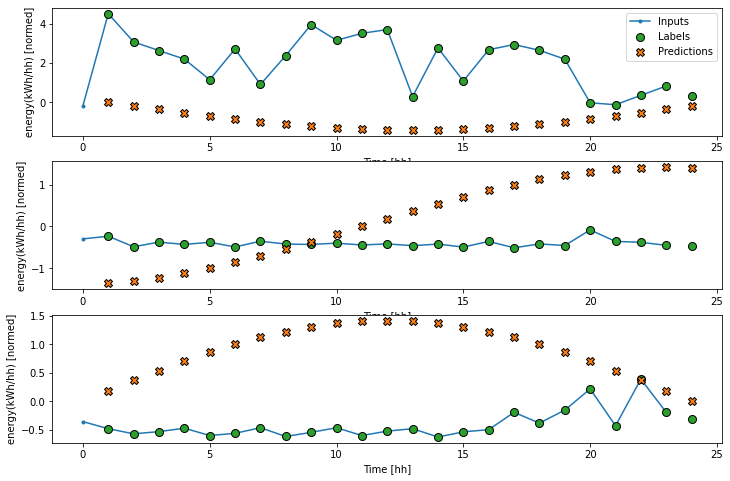

In [22]:
wide_window.plot(baseline)


In [23]:
linear = tf.keras.Sequential([
    tf.keras.layers.Dense(units=1)
])


In [24]:
MAX_EPOCHS = 20

def compile_and_fit(model, window, patience=2):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')

  model.compile(loss=tf.losses.MeanSquaredError(),
                optimizer=tf.optimizers.Adam(),
                metrics=[tf.metrics.MeanAbsoluteError()])

  history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history

In [25]:
history = compile_and_fit(linear, single_step_window)

val_performance['Linear'] = linear.evaluate(wide_window.val)
performance['Linear'] = linear.evaluate(wide_window.test, verbose=0)


Epoch 1/20
869/869 [==============================] - 1s 921us/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 2/20
248/248 [==============================] - 0s 857us/step - loss: nan - mean_absolute_error: nan


ERROR! Session/line number was not unique in database. History logging moved to new session 54


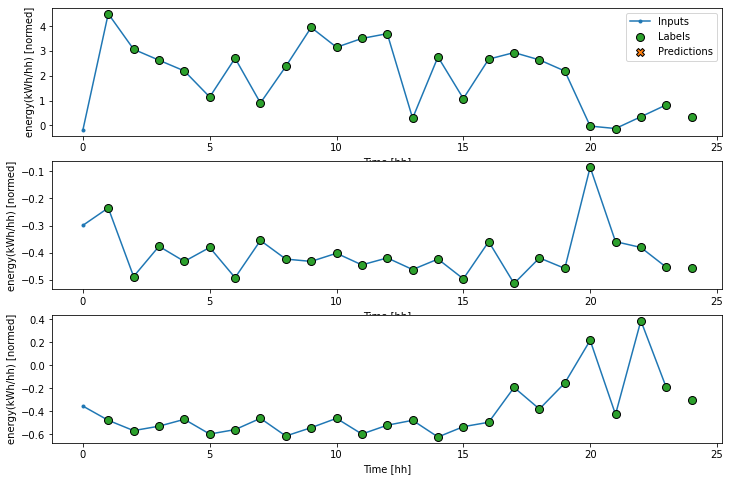

In [27]:
wide_window.plot(linear)


In [26]:
dense = tf.keras.Sequential([
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=1)
])

history = compile_and_fit(dense, single_step_window)

val_performance['Dense'] = dense.evaluate(single_step_window.val)
performance['Dense'] = dense.evaluate(single_step_window.test, verbose=0)


ERROR! Session/line number was not unique in database. History logging moved to new session 46
Epoch 1/20
869/869 [==============================] - 1s 1ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 2/20
249/249 [==============================] - 0s 655us/step - loss: nan - mean_absolute_error: nan


ERROR! Session/line number was not unique in database. History logging moved to new session 48
Epoch 1/50


ERROR! Session/line number was not unique in database. History logging moved to new session 52


ERROR! Session/line number was not unique in database. History logging moved to new session 50
